In [67]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
from IPython.display import Image

# Image Enhancement

## Adjusting Brighness
Adjusting brightness can be achieved by incresing or decreasing the images pixel values by some amount.

Use 

`cv.add`  https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga10ac1bfb180e2cfda1701d06c24fdbd6

or

`cv.subtract`  https://docs.opencv.org/3.4/d2/de8/group__core__array.html#gaa0f00d98b4b5edeaeb7b8333b2de353b

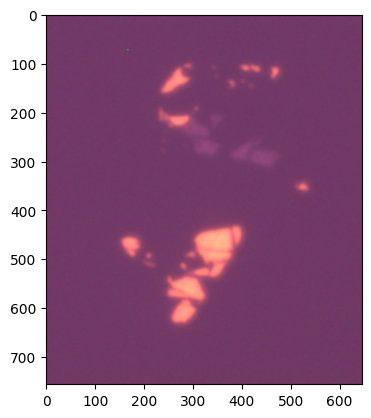

In [68]:
# Load image
tmds_bgr = cv.imread("images/TMDs.tif", cv.IMREAD_COLOR)  # NOTE OpenCV loads images in BGR order
tmds_rgb = tmds_bgr[:,:,::-1]  # flip order of channels to convert to RGB order

plt.imshow(tmds_rgb)

Text(0.5, 1.0, 'Brighter')

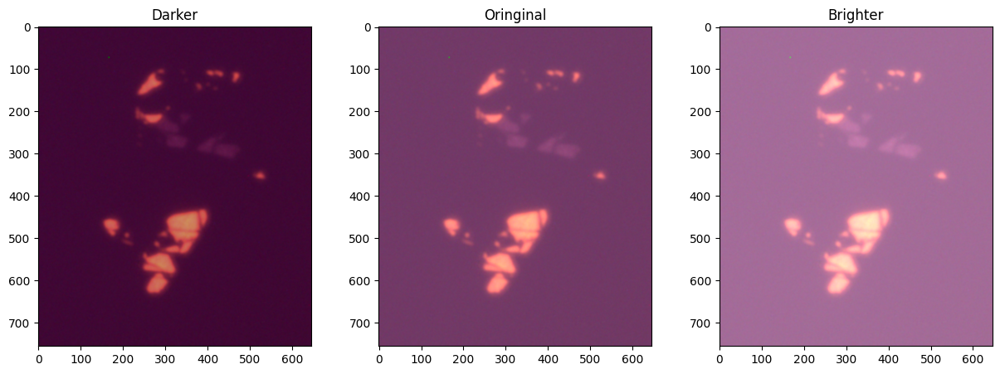

In [69]:
# Create an array with the same shape of the image, containing values which will modify the images values
adjustment_value:int = 50
matrix = np.full_like(tmds_rgb, adjustment_value)  # Same shape as image, filled with adjustment_value

img_brighter = cv.add(tmds_rgb, matrix)  # tmds_rgb + matrix
img_darker = cv.subtract(tmds_rgb, matrix)  # tmds_rgb - matrix

# Show figures
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(img_darker); plt.title("Darker")
plt.subplot(132); plt.imshow(tmds_rgb); plt.title("Oringinal")
plt.subplot(133); plt.imshow(img_brighter); plt.title("Brighter")

## Adjusting Contrast
"Contrast is the difference in luminance or colour that makes an object (or its representation in an image or display) distinguishable."  https://en.wikipedia.org/wiki/Contrast_(vision).  Accessed Oct 2022.

Adjusting the contrast of an image can be achieved by multiplying all of the image's values by some factor.

Be sure to multiply values as floating point numbers (0.654), not integers (2). 

After multiplying remember to convert back to the original images dtype (usually 8-bit unsigned (np.uint8)) before displaying.

Text(0.5, 1.0, 'Higher Contrast')

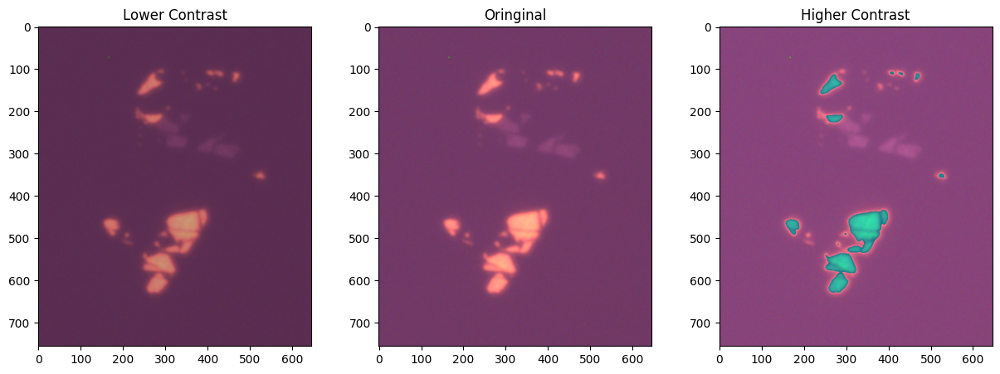

In [70]:
# Create an array with the same shape of the image, containing values which will modify the images values.
# For multiplication use the highest precision floating point numbers (np.float64)
matrix1 = np.full_like(tmds_rgb, 0.8, dtype=np.float64)  # Same shape as image, filled with 64-bit float values of 0.8
matrix2 = np.full_like(tmds_rgb, 1.2, dtype=np.float64)  # Same shape as image, filled with 64-bit float values of 1.2

# Convert the original image to 64-bit float with img.astype(np.float64)
img_f64 = tmds_rgb.astype(np.float64)

# Multiply images
lower_contrast_f64 = cv.multiply(img_f64, matrix1)  # tmds_rgb * matrix1
higher_contrast_f64 = cv.multiply(img_f64, matrix2)  # tmds_rgb * matrix2

# Convert back to 8-bit images with np.uint8(img)
lower_contrast, higher_contrast = np.uint8(lower_contrast_f64), np.uint8(higher_contrast_f64)

# Show figures
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(lower_contrast); plt.title("Lower Contrast")
plt.subplot(132); plt.imshow(tmds_rgb); plt.title("Oringinal")
plt.subplot(133); plt.imshow(higher_contrast); plt.title("Higher Contrast")

This process can cause overflow errors where the modified values lie outside of the original dtypes range (e.g. >255 for uint8), as seen above.

This can be avoided by using `np.clip`  https://numpy.org/doc/stable/reference/generated/numpy.clip.html

Text(0.5, 1.0, 'Higher Contrast')

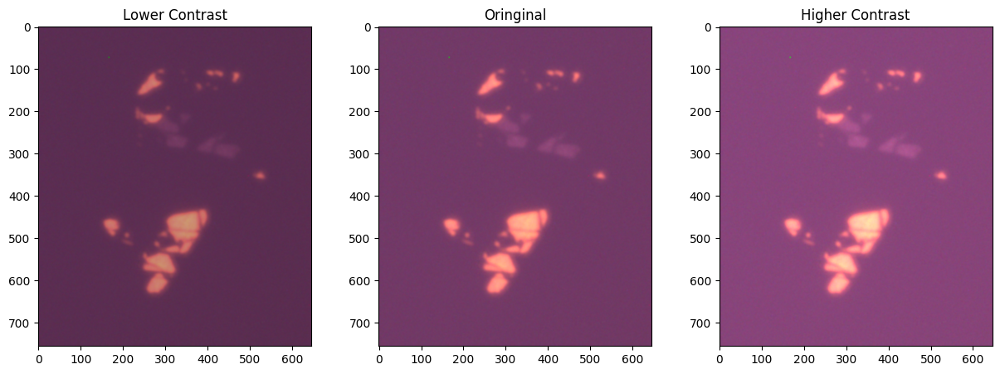

In [71]:
# Create an array with the same shape of the image, containing values which will modify the images values.
# For multiplication use the highest precision floating point numbers (np.float64)
matrix1 = np.full_like(tmds_rgb, 0.8, dtype=np.float64)  # Same shape as image, filled with 64-bit float values of 0.8
matrix2 = np.full_like(tmds_rgb, 1.2, dtype=np.float64)  # Same shape as image, filled with 64-bit float values of 1.2

# Convert the original image to 64-bit float with img.astype(np.float64)
img_f64 = tmds_rgb.astype(np.float64)

# Multiply images
lower_contrast_f64 = cv.multiply(img_f64, matrix1)  # tmds_rgb * matrix1
higher_contrast_f64 = cv.multiply(img_f64, matrix2)  # tmds_rgb * matrix2

# Avoid overflow errors - target range (uint8: 0-255)
higher_contrast_clipped = np.clip(higher_contrast_f64, 0, 255)  # Oversaturated values are clipped to the maximum value

# Convert back to 8-bit images with np.uint8(img)
lower_contrast, higher_contrast = np.uint8(lower_contrast_f64), np.uint8(higher_contrast_clipped)

# Show figures
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(lower_contrast); plt.title("Lower Contrast")
plt.subplot(132); plt.imshow(tmds_rgb); plt.title("Oringinal")
plt.subplot(133); plt.imshow(higher_contrast); plt.title("Higher Contrast")

## Morphological Transforms / Filtering
These transformations are commonly used to clean-up images, or to select certain feature types inside images. 

In [72]:
# Load example image
morph_img = cv.imread("images/Morphological_example.png", cv.IMREAD_GRAYSCALE)

### Erosion
This method erodes the surfaces of pixels with value 1 in binary images.

Use `cv.erode(image, kernel, iterations)`  https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaeb1e0c1033e3f6b891a25d0511362aeb

Text(0.5, 1.0, 'Eroded')

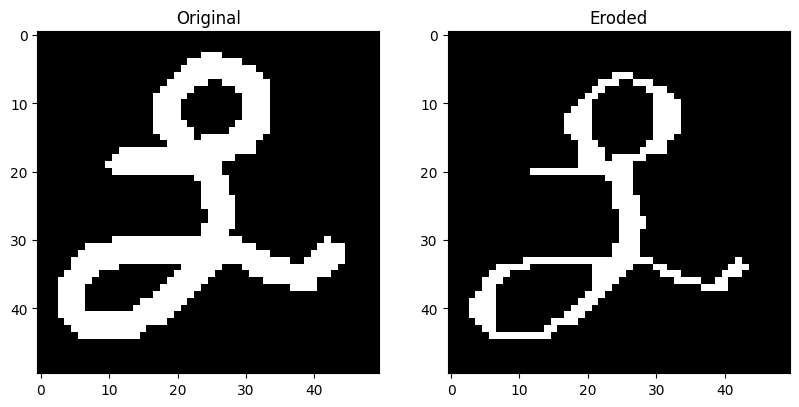

In [73]:
eroded = cv.erode(morph_img, kernel=(11, 11), iterations=3)

# Show figures
cmap = "gray"
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(morph_img, cmap=cmap); plt.title("Original")
plt.subplot(132); plt.imshow(eroded, cmap=cmap); plt.title("Eroded")

### Dilation
The opposite of Erosion, the region around pixels with value 1 in binary images is set to 1. This expands the surface of objects.

Use `cv.dilate(image, kernel, iterations)`  https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga4ff0f3318642c4f469d0e11f242f3b6c

Text(0.5, 1.0, 'Dilated')

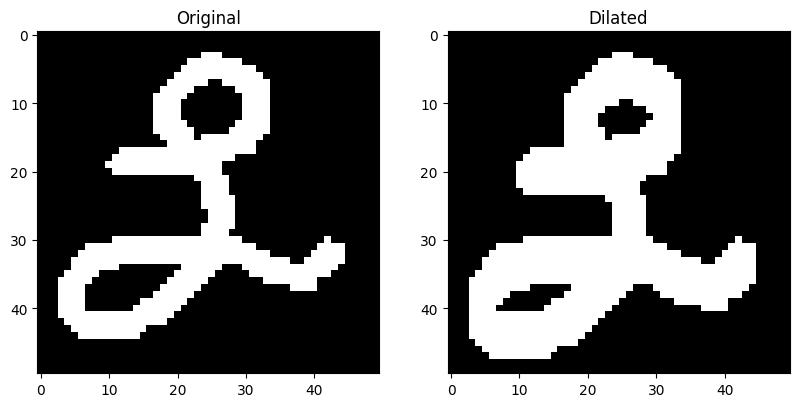

In [74]:
dilated = cv.dilate(morph_img, kernel=(11,11), iterations=3)

# Show figures
cmap = "gray"
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(morph_img, cmap=cmap); plt.title("Original")
plt.subplot(132); plt.imshow(dilated, cmap=cmap); plt.title("Dilated")

### Opening
Opening is just erosion followed by dilation, it is effective in removing salt noise (such as hot pixels)

Text(0.5, 1.0, 'Opened')

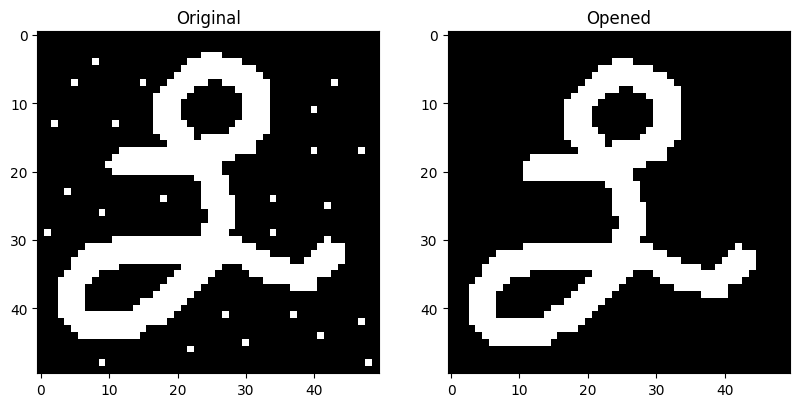

In [75]:
# Load noisy image
salt_noise = cv.imread("images/Morphological_example_salt_noise.png", cv.IMREAD_GRAYSCALE)

kernel = (11,11)
iterations = 1

eroded = cv.erode(salt_noise, kernel, iterations=iterations)
dilated = cv.dilate(eroded, kernel, iterations=iterations)

# Show figures
cmap = "gray"
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(salt_noise, cmap=cmap); plt.title("Original")
plt.subplot(132); plt.imshow(dilated, cmap=cmap); plt.title("Opened")

### Closing
Similar to opening but with the dilation before erosion, this effectively removes pepper noise from the images.

Text(0.5, 1.0, 'Closed')

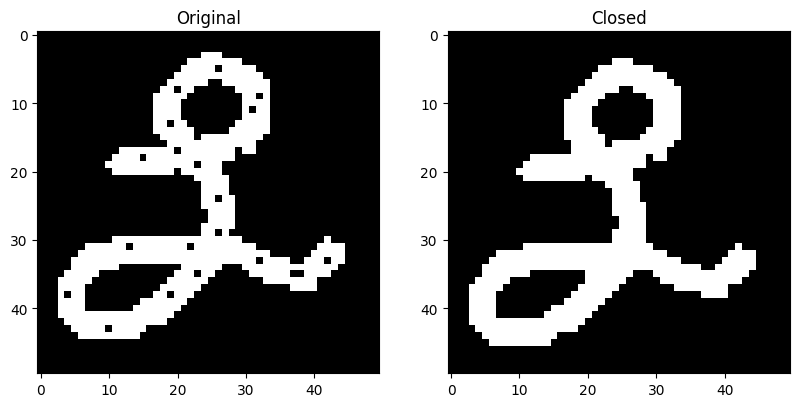

In [76]:
# Load noisy image
pepper_noise = cv.imread("images/Morphological_example_pepper_noise.png", cv.IMREAD_GRAYSCALE)

kernel = (11,11)
iterations = 1

dilated = cv.dilate(pepper_noise, kernel, iterations=iterations)
eroded = cv.erode(dilated, kernel, iterations=iterations)

# Show figures
cmap = "gray"
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(pepper_noise, cmap=cmap); plt.title("Original")
plt.subplot(132); plt.imshow(eroded, cmap=cmap); plt.title("Closed")

### Gaussian Blur
Apply a gaussian filter to the image to blur it. Commonly used to simplify images for further processing.

Use `cv.GaussianBlur(image, kernel_size, sigmaX, sigmaY)`

The **kernel_size** parameter is used to set the size of the area around each pixel which is considered when blurring. This must be 2 odd numbers in a tuple, e.g. (5,5)

Text(0.5, 1.0, 'Gaussian Blur')

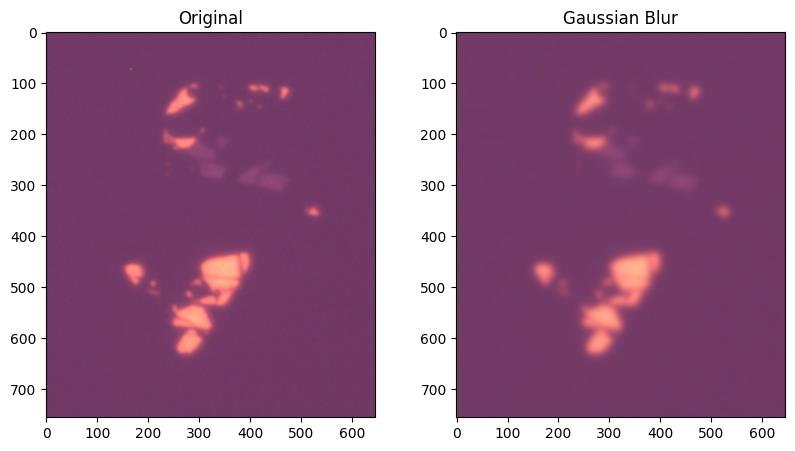

In [77]:
tmds_smoothed = cv.GaussianBlur(tmds_rgb, (51,51), 5, 5)

# Show figures
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(tmds_rgb); plt.title("Original")
plt.subplot(132); plt.imshow(tmds_smoothed); plt.title("Gaussian Blur")

### Median Filter
Perhaps one of the most useful filtering techinques, median filtering repaces each pixel with the meduan of it's neighbouring pixels.

Use `cv.medianBlur(image, kernel_size)`  https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#ga564869aa33e58769b4469101aac458f9

Text(0.5, 1.0, 'Median Filtered')

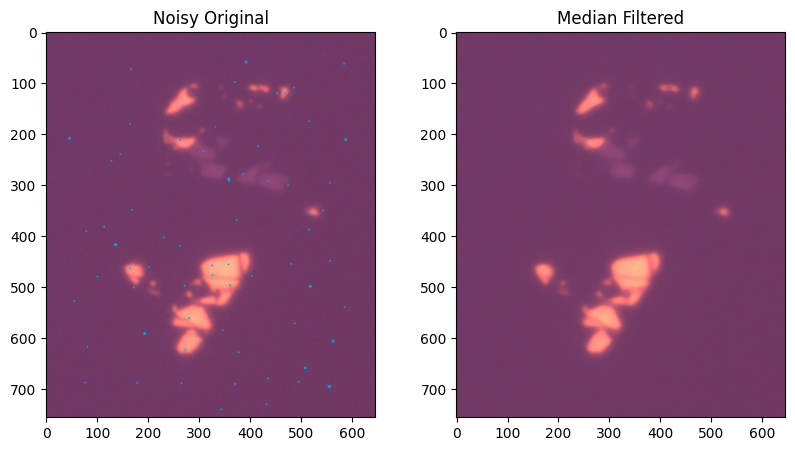

In [78]:
noisy_tmds = cv.imread("images/TMDs_noisy.png", cv.IMREAD_COLOR)  # Loads in BGR order
noisy_tmds = noisy_tmds[:,:,::-1]  # Convert to RGB order

median_filtered = cv.medianBlur(noisy_tmds, 11)

# Show figures
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(noisy_tmds); plt.title("Noisy Original")
plt.subplot(132); plt.imshow(median_filtered); plt.title("Median Filtered")

## Image Thresholding
Used to create binary images which can be used for all sorts of image processing. Commonly binary images are used as masks, allowing modification of select parts of an image while leaving the remaining parts unchanged.

Use either

`cv.threshold(src, thresh, maxVal, type)`  https://docs.opencv.org/4.x/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57

or

`cv.adaptiveThreshold(src, maxVal, adaptiveMethod, thresholdType, blockSize, C)`  https://docs.opencv.org/4.x/d7/d1b/group__imgproc__misc.html#ga72b913f352e4a1b1b397736707afcde3



### Simple Thresholding

Text(0.5, 1.0, 'H Channel Thresholded')

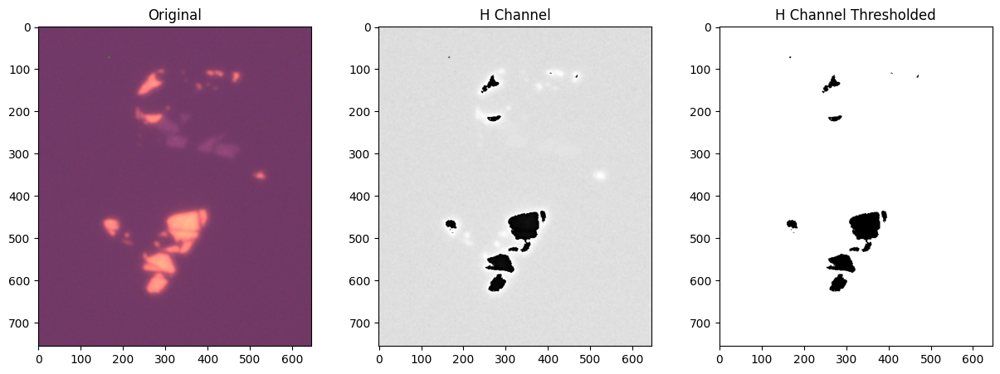

In [79]:
# Convert image to HSV and threshold in H channel to select colour
tmds_hsv = cv.cvtColor(tmds_rgb, cv.COLOR_RGB2HSV_FULL)

# Split channels
h, s, v =cv.split(tmds_hsv)

# Perform thresholding
return_value, h_thresholded = cv.threshold(h, 100, 175, cv.THRESH_BINARY)  # return_value is not important right now

# Display Images
plt.figure(figsize=(15,5))
plt.subplot(131); plt.imshow(tmds_rgb); plt.title("Original")
plt.subplot(132); plt.imshow(h, cmap="gray"); plt.title("H Channel")
plt.subplot(133); plt.imshow(h_thresholded, cmap="gray"); plt.title("H Channel Thresholded")

### Different threshold options
With the `cv.threshold` function you can use different methods to perform simple thresholding, some examples are below: 

NOTE: use the different methods like:
`cv.threshold(img, threshold, assign_to_value, cv.THRESH_TOZERO)`

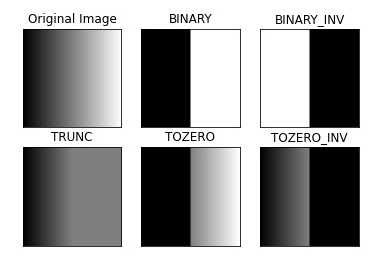

In [80]:
Image("images/ThresholdingModes.png")

### Adaptive Thresholding

(1068, 1421)


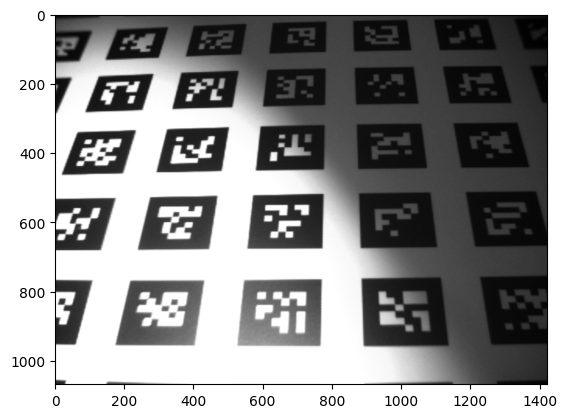

In [81]:
# Load ArUco marker image
markers = cv.imread("Images/ArUco_Markers.png", cv.IMREAD_GRAYSCALE)
print(markers.shape)
plt.imshow(markers, cmap="gray")

# Sourced from: Bradley, Derek & Roth, Gerhard. (2007). Adaptive Thresholding using the Integral Image. J. Graphics Tools. 12. 13-21. 10.1080/2151237X.2007.10129236. 

Text(0.5, 1.0, 'Adaptive threshold')

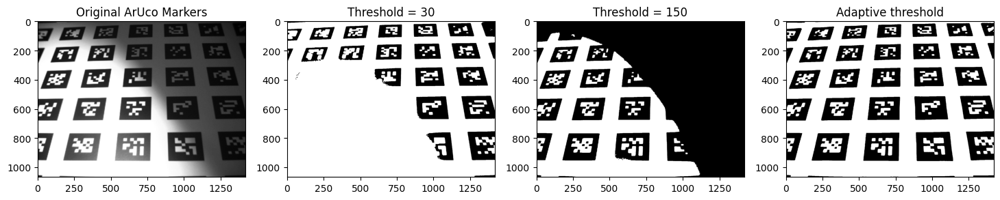

In [82]:
# Compare adaptive and non-adaptive thresholding
# Simple Thresholds
threshold1 = 30
threshold2 = 150
_, simple_threshold1 = cv.threshold(markers, threshold1, 255, cv.THRESH_BINARY)  # _, img = ... discards the first returned variable (return_value in this case) as we don't need it.
_, simple_threshold2 = cv.threshold(markers, threshold2, 255, cv.THRESH_BINARY)

# Adaptive Threshold
adaptive_threshold = cv.adaptiveThreshold(markers, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 161, 7)

plt.figure(figsize=(18,5))
plt.subplot(141); plt.imshow(markers, cmap="gray"); plt.title("Original ArUco Markers")
plt.subplot(142); plt.imshow(simple_threshold1, cmap="gray"); plt.title(f"Threshold = {threshold1}")
plt.subplot(143); plt.imshow(simple_threshold2, cmap="gray"); plt.title(f"Threshold = {threshold2}")
plt.subplot(144); plt.imshow(adaptive_threshold, cmap="gray"); plt.title("Adaptive threshold")

## Bitwise Operations
Combine 2 images using bitwise operations

Text(0.5, 1.0, 'Circle')

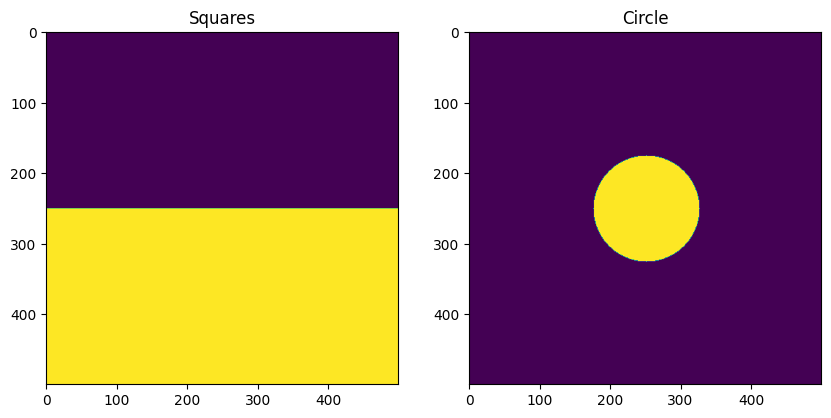

In [83]:
# Create images
squares = np.zeros((500,500), dtype=np.uint8)
squares[251:] = 255

circle = np.zeros((500,500), dtype=np.uint8)
cv.circle(circle, (251,251), 75, color=255, thickness=cv.FILLED)

plt.figure(figsize=(10,5))
plt.subplot(121); plt.imshow(squares); plt.title("Squares")
plt.subplot(122); plt.imshow(circle); plt.title("Circle")

### Bitwise AND Operator
In regions where **both** images are 1, the output will be 1

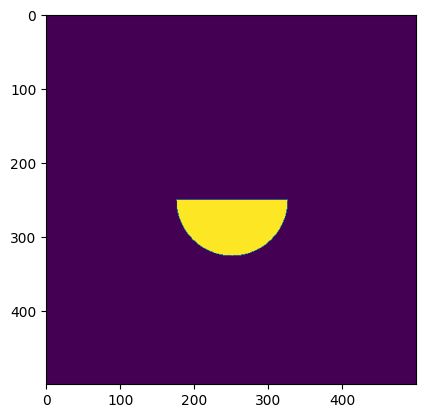

In [84]:
result = cv.bitwise_and(squares, circle)  # result = squares & circle

plt.imshow(result)

### Bitwise OR Operator
In regions where **either** image is 1, the output will be 1 

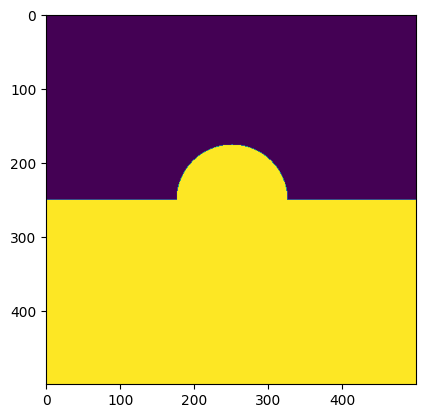

In [85]:
result = cv.bitwise_or(squares, circle)  # result = squares | circle

plt.imshow(result)

### Bitwise XOR Operator
In regions where **only** one image is 1, the output will be 1

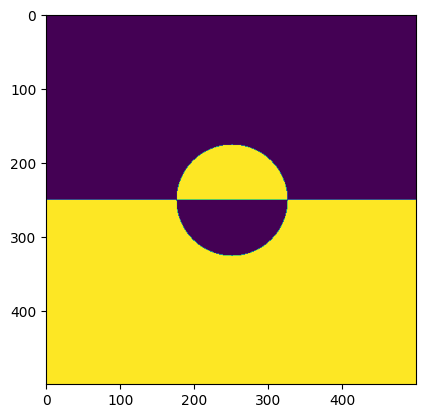

In [86]:
result = cv.bitwise_xor(squares, circle)  # result = squares ^ circle

plt.imshow(result)

## Example: Logo Manipulation
Here's an example using the above techniques to produce a new logo for HWU

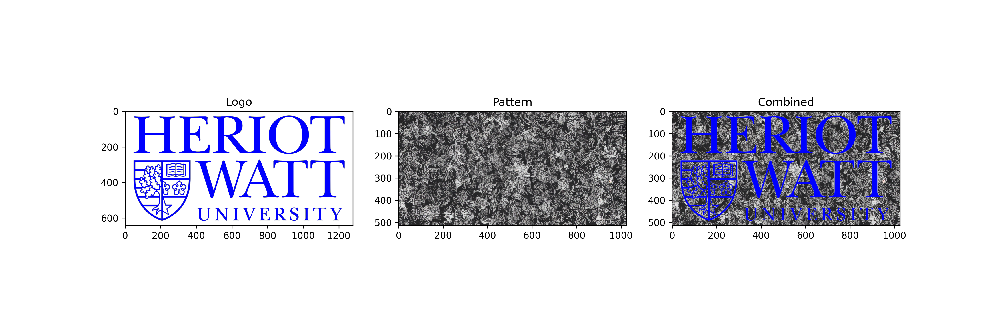

In [87]:
# Read images
logo_bgr = cv.imread("images/Heriot-Watt_Logo.png", cv.IMREAD_COLOR)  # Loaded in BGR order
logo = logo_bgr [:,:,::-1]  # Reverse channel order to convert to RGB
pattern = cv.imread("images/StableDiffusion_Pattern.png", cv.IMREAD_COLOR)  # Reading a grayscale image as a colour image

Image("images/Example_Modified_Logo.png")

### Rescale images to match dimensions
```
array.shape = (height, width, channel)
```


Resizing Logo...
Old shape: (640, 1280, 3), New shape: (512, 1025, 3),
Original aspect Ratio: 2.0000, New aspect ratio: 2.0020
Logo shape: (512, 1025, 3), pattern shape: (512, 1025, 3)



Text(0.5, 1.0, 'Stable Diffusion generated pattern')

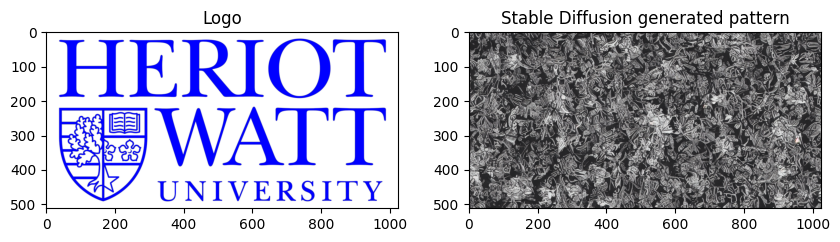

In [88]:
# Rescale logo to fit pattern
pattern_width = pattern.shape[1]
scale_factor = pattern_width / logo.shape[1]
new_height = int(logo.shape[0] * scale_factor)  # logo height * scale_factor
resized_logo = cv.resize(logo, dsize=(pattern_width, new_height), interpolation=cv.INTER_AREA)

# Print image rescaling details
print(f"""
Resizing Logo...
Old shape: {logo.shape}, New shape: {resized_logo.shape},
Original aspect Ratio: {logo.shape[1]/logo.shape[0]:0.4f}, New aspect ratio: {resized_logo.shape[1]/resized_logo.shape[0]:0.4f}
Logo shape: {resized_logo.shape}, pattern shape: {pattern.shape}
""")

plt.figure(figsize=(10,5))
plt.subplot(121); plt.imshow(resized_logo); plt.title("Logo")
plt.subplot(122); plt.imshow(pattern); plt.title("Stable Diffusion generated pattern")

### Create Logo Mask

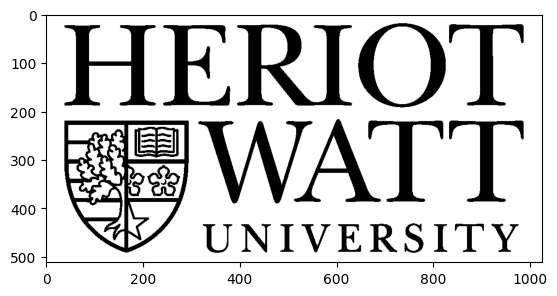

In [89]:
threshold_value = 200

# Convert to grayscale
gray_logo = cv.cvtColor(resized_logo, cv.COLOR_RGB2GRAY)  

# Perform threshold
_, logo_mask = cv.threshold(gray_logo, threshold_value, 255, cv.THRESH_BINARY)

plt.imshow(logo_mask, cmap="gray")

### Create a background by only selecting pixels where the HWU logo isn't

Masked pattern shape: (512, 1025, 3)


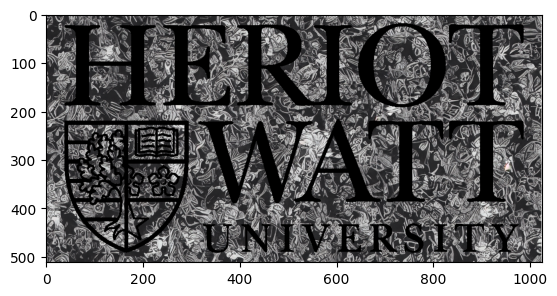

In [90]:
# Apply mask to pattern
masked_pattern = cv.bitwise_and(pattern, pattern, mask=logo_mask)

print(f"Masked pattern shape: {masked_pattern.shape}")
plt.imshow(masked_pattern)

### Isolate logo

(512, 1025, 3)


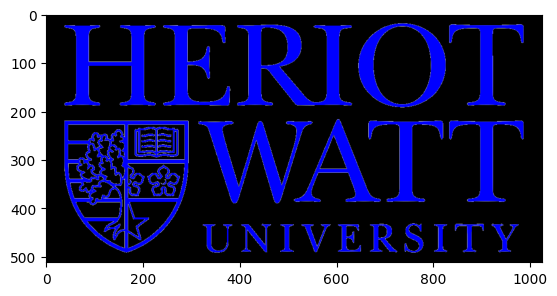

In [91]:
# Bitwise AND of logo and negative of the Logo's mask returns an isolated Logo
isolated_logo = cv.bitwise_and(resized_logo, resized_logo, mask=cv.bitwise_not(logo_mask))

print(isolated_logo.shape)
plt.imshow(isolated_logo)

### Finally, Merge Isolated Logo and Masked Pattern

True

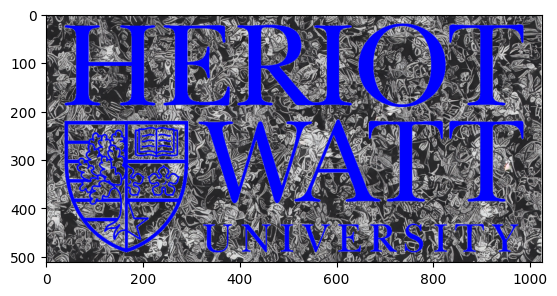

In [92]:
# Overlay
result = cv.add(masked_pattern, isolated_logo)

plt.imshow(result)

# Save modified logo
cv.imwrite("images/Modified_Logo.png", result[:,:,::-1])  # Remeber to convert RGB to BGR order

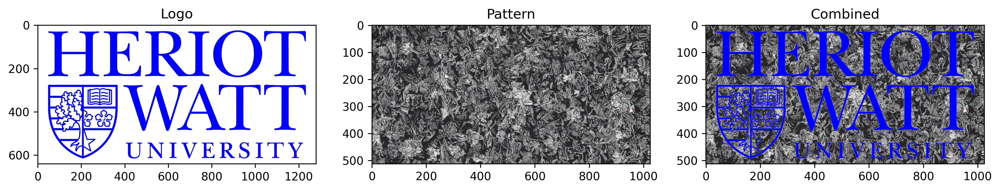

In [93]:
# Save outline of logo manipulation
plt.figure(figsize=(15,5), dpi=300)
plt.subplot(131); plt.imshow(logo); plt.title("Logo")
plt.subplot(132); plt.imshow(pattern); plt.title("Pattern")
plt.subplot(133); plt.imshow(result); plt.title("Combined")

plt.savefig("images/Example_Modified_Logo.png", bbox_inches=None, pad_inches=0.1)

### How can we make Heriot-Watt more green?

True

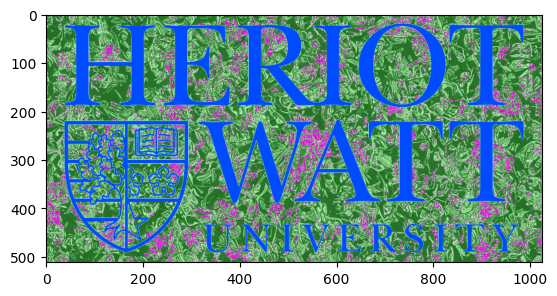

In [94]:
modified_pattern = masked_pattern.copy()  # Copy to avoid changing orignial image

# Increase masked_pattern's Green channel by 75
modified_pattern[:,:,1] += 75  

# Overlay
new_logo = cv.add(modified_pattern, isolated_logo)

plt.imshow(new_logo)

# Save 'Greenified' logo
cv.imwrite("images/Modified_Logo_Greenified.png", new_logo[:,:,::-1])

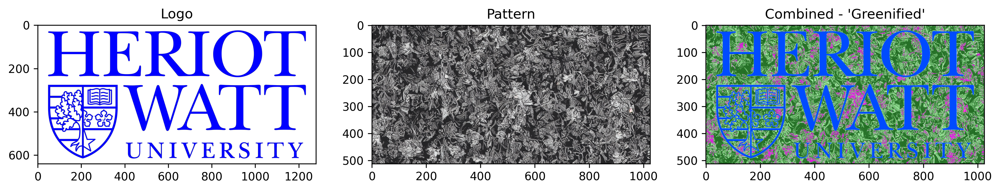

In [95]:
# Save outline of logo manipulation
plt.figure(figsize=(15,5), dpi=300)
plt.subplot(131); plt.imshow(logo); plt.title("Logo")
plt.subplot(132); plt.imshow(pattern); plt.title("Pattern")
plt.subplot(133); plt.imshow(new_logo); plt.title("Combined - 'Greenified'")

plt.savefig("images/Example_Modified_Logo_Greenified.png", bbox_inches=None, pad_inches=0.1)